# Data Preprocessing Notebook

In this notebook data is being prepared (and augmented) for its further use in model training and evaluation.

Although augmenting functions are already described in augmenters.py, they need certain edits for multithreaded batch application.


The Dataset is called [UrbanSound8K](https://urbansounddataset.weebly.com/urbansound8k.html). It is not included in the repository due to its size. The dataset can be accessed by following the link attached to its name. It is a set of audio recordings from different classes of sounds that one can encounter on a street of a city. A short overview of the data is provided below.


In [12]:
import sys
import os
sys.path.append(os.path.abspath("py/"))

from batchproc import *
from setup import *
from helpers import *



def read_to_df(df, sr=sr):
    for i, r in df.iterrows():
        path = f"../Data/UrbanSound8K/audio/fold{r['fold']}/{r['slice_file_name']}"
        y = load_audio(path, sr)
        df.at[i, 'y_s'] = np.asarray(y)
    return df


original_df = pd.read_csv("../Data/UrbanSound8K/metadata/UrbanSound8K.csv")
original_df['y_s'] = [[]]*len(original_df)
original_df = read_to_df(original_df)
save_path = "../Data/pkl/"

In [13]:
original_df.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,y_s
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,"[-0.00426584, -0.004868033, -0.0044087917, -0...."
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,"[0.11602241, 0.13080758, 0.11556307, 0.1070473..."
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,"[-0.21757305, -0.21378268, -0.1619468, -0.1527..."
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,"[0.007129775, 0.0013825614, -0.005482822, -0.0..."
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,"[0.10318634, 0.16683681, 0.2523664, 0.36029422..."


Dataset in question is nice in many things. First, it contains 10 different classes, which are comparable in size. Second, all samples are split into folds, which will make it a bit easier to launch an experiment. Below are some statistics.


<AxesSubplot:>

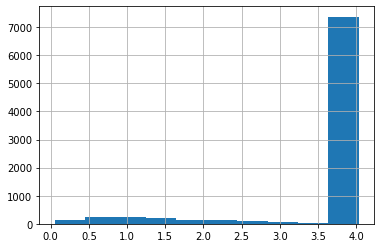

In [14]:
original_df['l'] = original_df.y_s.apply(lambda y: len(y)/sr)
original_df['l'].hist(bins=10)

<AxesSubplot:xlabel='class'>

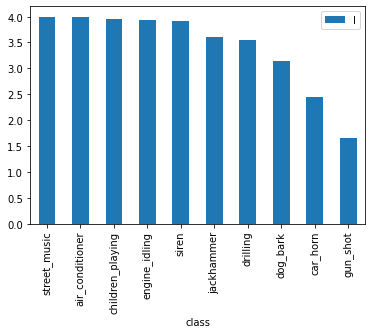

In [15]:
original_df[['class', 'l']].groupby('class').mean(
).sort_values('l', ascending=False).plot.bar()

As you may see, different classes have different average recording lengths. This information could have been used to improve accuracy (among other metrics of the audio signal, see [Librosa Features](https://librosa.org/doc/main/feature.html)). This caveat is simply ignored. It might cause some misalignment along time axis, but it is better than padding shorter signals to a maximum length, as later will introduce serious information loss.


In [16]:
original_df.groupby(['fold', 'class'],
                    group_keys=False).size().unstack(fill_value=0)

class,air_conditioner,car_horn,children_playing,dog_bark,drilling,engine_idling,gun_shot,jackhammer,siren,street_music
fold,,,,,,,,,,
1,100,36,100,100,100,96,35,120,86,100
2,100,42,100,100,100,100,35,120,91,100
3,100,43,100,100,100,107,36,120,119,100
4,100,59,100,100,100,107,38,120,166,100
5,100,98,100,100,100,107,40,120,71,100
6,100,28,100,100,100,107,46,68,74,100
7,100,28,100,100,100,106,51,76,77,100
8,100,30,100,100,100,88,30,78,80,100
9,100,32,100,100,100,89,31,82,82,100


In order to reduce training time and simluate data deficit, original dataset is reduced in size and the augmented.


In [17]:
len_original = len(original_df)
original_df = original_df.groupby(['fold', 'class'], group_keys=False).apply(
    lambda x: x.sample(n=int(min(20, 0.3*len(x))))).reset_index()
len_new = len(original_df)
print(len_original, len_new)

8732 1822


In [18]:
original_df.head()

,index,slice_file_name,fsID,start,end,salience,fold,classID,class,y_s,l
0,3867,177621-0-0-145.wav,177621,72.500000,76.500000,2,1,0,air_conditioner,"[-0.4007591, -0.38111922, -0.36777094, -0.3796...",4.000000
1,6874,57320-0-0-5.wav,57320,2.500000,6.500000,2,1,0,air_conditioner,"[0.03709695, 0.039567284, 0.032104272, 0.04308...",4.000021
2,6856,57320-0-0-11.wav,57320,5.500000,9.500000,2,1,0,air_conditioner,"[-0.008448858, -0.018039681, 0.002844925, 0.02...",4.000021
3,6658,50901-0-0-0.wav,50901,1.006702,5.006702,1,1,0,air_conditioner,"[-0.19166422, -0.19701955, -0.16194226, -0.163...",4.000021
4,1383,134717-0-0-0.wav,134717,0.000000,4.000000,1,1,0,air_conditioner,"[-0.09520515, -0.12015822, -0.13029847, -0.155...",4.000021


In [19]:
random_samples = {}
for cls in original_df['class'].unique():
    random_samples.update({cls: original_df[original_df['class'] == cls].sample(1)[
                          'slice_file_name'].values[0]})

So, generally, everything is ok in this dataset except for some sample lengths. Plots above show that some classes have generally shorter recording lengths, which might negatively affect the overall performance on a model trained on such data, as every signal in converted into 224x224 (300x300) pixel image. One option would be to zero-pad shorter signals, but it might have an even worse effect, as padding will simply reduce the amount of useful information on an image. This question remains open. After all, fixing this problem is not the main objective of this work.


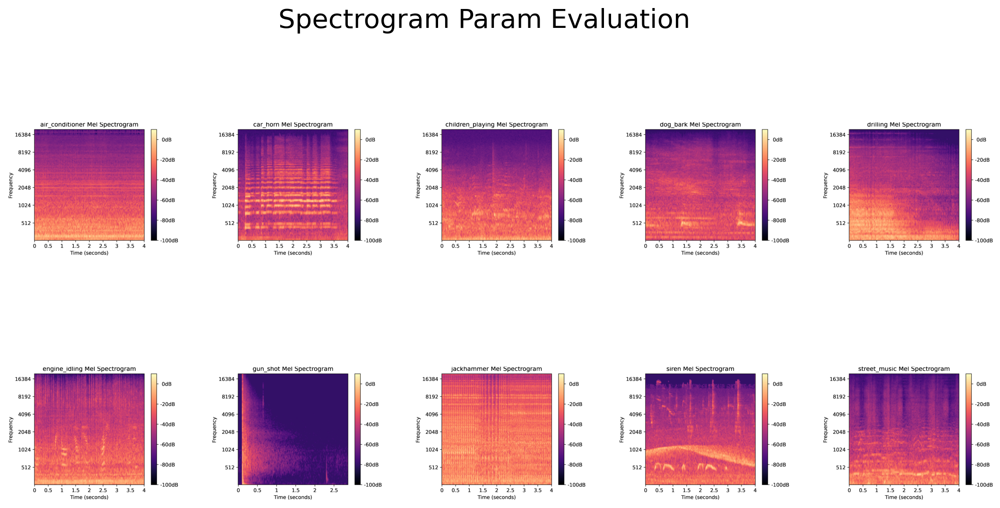

In [20]:
# Example spectrograms, from each class. Visually one can tell that there is a notable difference between the classes.
# What is important to note here is that the length of the audio files is not consistent, even though images all have the same size.
plot_specs(original_df, label='Spectrogram Param Evaluation',
           clss=random_samples, from_y=True)

In [21]:
lookup = {}
lookup['air_conditioner'] = 'Air Conditioner'
lookup['car_horn'] = 'Car Horn'
lookup['children_playing'] = 'Children Playing'
lookup['dog_bark'] = 'Dog Bark'
lookup['drilling'] = 'Drilling'
lookup['engine_idling'] = 'Engine Idling'
lookup['gun_shot'] = 'Gun Shot'
lookup['jackhammer'] = 'Jackhammer'
lookup['siren'] = 'Siren'
lookup['street_music'] = 'Street Music'

for label in lookup.keys():
    img = build_spec(original_df[original_df.slice_file_name == random_samples[label]]['y_s'].values[0], sr, mode="mel",
                             num_filters=186, db=(-100, 10), flim=(20, 20000), label=lookup[label])

## 0. Simple Spectrogram calculation

Here we are just recalculating spectrograms for unedited recordigns


In [10]:
spectrum_df = original_df.copy()

res = pcc(spectrum_df, batch_spec, n_cores=16)
spectrum_df['r'] = spectrum_df.index.to_series().apply(lambda x: res[x])
spectrum_df[['slice_file_name', 'fold', 'class',
             'classID', 'r']].to_pickle(save_path + "spectrum.pkl")

[(224, 224, 3)]


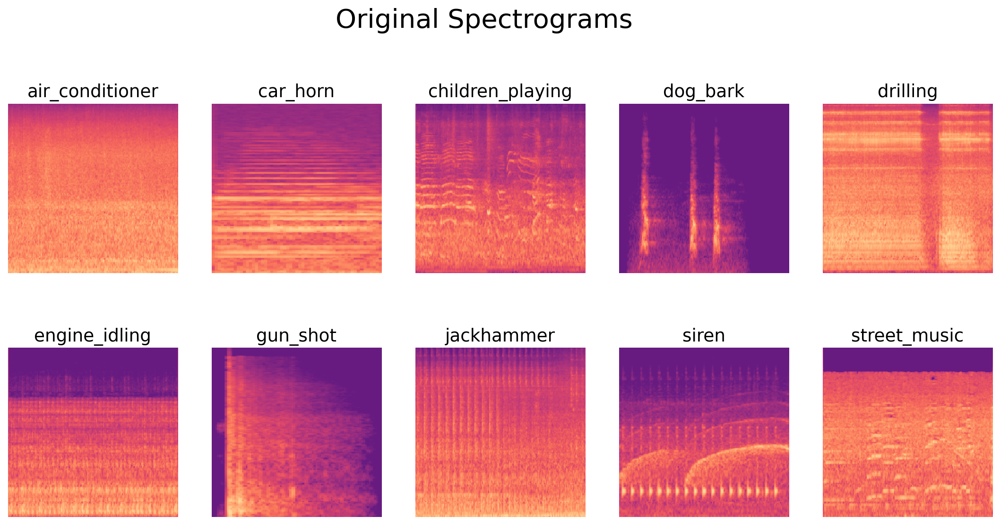

In [11]:
spectrum_df = pd.read_pickle(save_path + "spectrum.pkl")
print(spectrum_df['r'].apply(np.shape).unique())
plot_specs(spectrum_df, label="Original Spectrograms", clss=random_samples)

## 1. Heavy Distortion Effect

In this part, original recordings are being distorted, before being fed into the spectrogram plotter.


In [12]:
dist_df = original_df.copy()

res = pcc(dist_df, batch_spec_dist, n_cores=16)
dist_df['r'] = dist_df.index.to_series().apply(lambda x: res[x])
dist_df[['slice_file_name', 'fold', 'class',
         'classID', 'r']].to_pickle(save_path + "dist.pkl")

Notice how colors and shapes change. Corresponding images remain somewhat similar, while their forms change slightly.


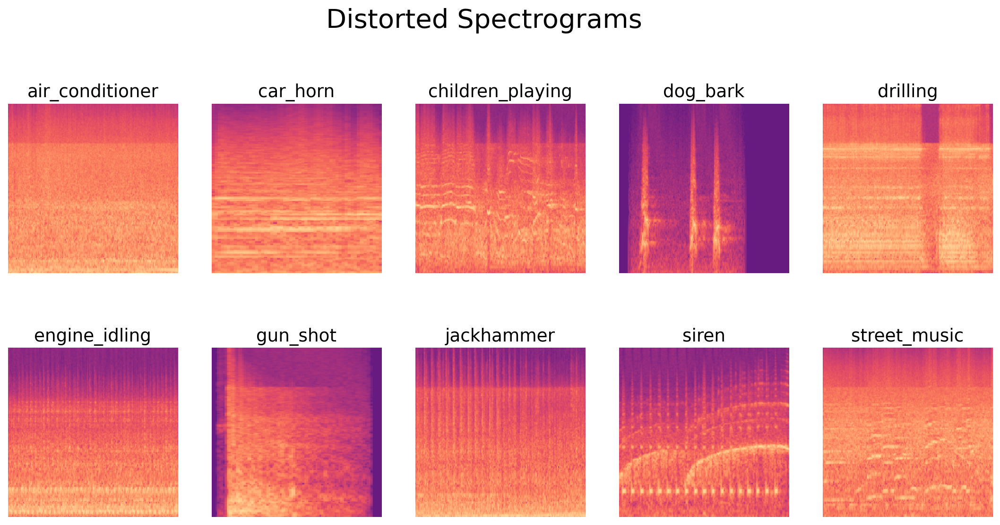

In [13]:
dist_df = pd.read_pickle(save_path + "dist.pkl")
plot_specs(dist_df, label="Distorted Spectrograms", clss=random_samples)

## 2. Delay Effect

This part is very similar to a previous one, only effect is changing.


In [14]:
delay_df = original_df.copy()

res = pcc(delay_df, batch_spec_delay, n_cores=16)
delay_df['r'] = delay_df.index.to_series().apply(lambda x: res[x])
delay_df[['slice_file_name', 'fold', 'class', 'classID', 'r']
         ].to_pickle(save_path + "delay.pkl")

Here you can easily see that original images appear to simply overlap. In this delay setting we are not cutting delayed signals to their originals' length, effectively making every recording 15-20% longer. This change in time might have a positive impact too.


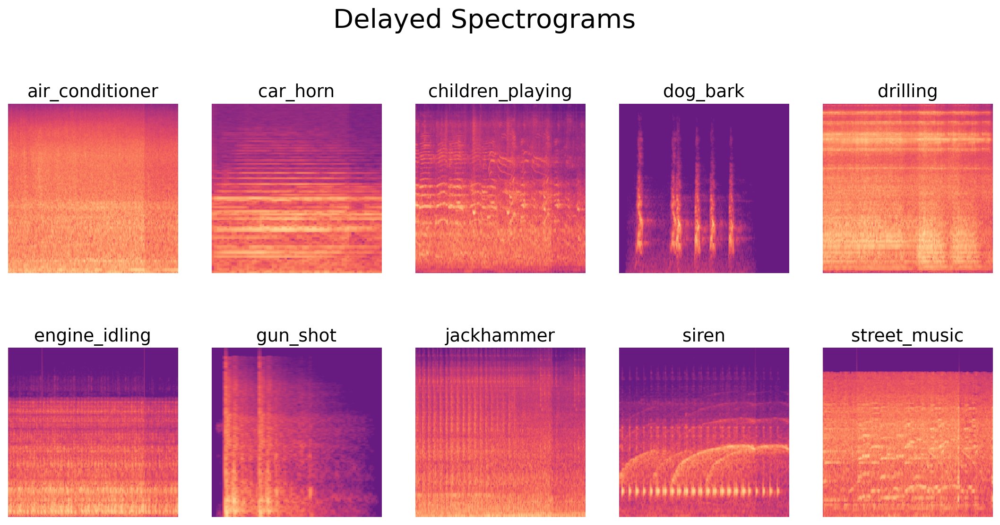

In [15]:
delay_df = pd.read_pickle(save_path + "delay.pkl")
plot_specs(delay_df, label="Delayed Spectrograms", clss=random_samples)

## 3a. Audio MixUp Augmentation

This procedure is significantly different from other ones and is the main reason why everything was not written in one cell. Here 2 samples have to be mixed together and new classId somewhere in between original ones has to be stored. I went for alpha = 0.8 (80% of the original and 20% of a new signal). Additional signal is chosen randomly. All sounds are being mixed within their folds in order to prevent target leak.


In [16]:
# alpha=0.8
mix_df = original_df.copy()

res = pcc_mixup(mix_df, batch_spec_mixup)
mix_df['r'] = mix_df.index.to_series().apply(lambda x: res[x])
mix_df['classID2'] = mix_df.r.apply(lambda x: x[1])
mix_df['r'] = mix_df.r.apply(lambda x: x[0])
mix_df[['slice_file_name', 'fold', 'class', 'classID',
        'r', 'classID2']].to_pickle(save_path + "mixup.pkl")

/Users/ivanstankov/Documents/Study/thesis_code/src/py/batchproc.py:104: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  split = np.array([df[df.fold == f].index.values for f in folds])


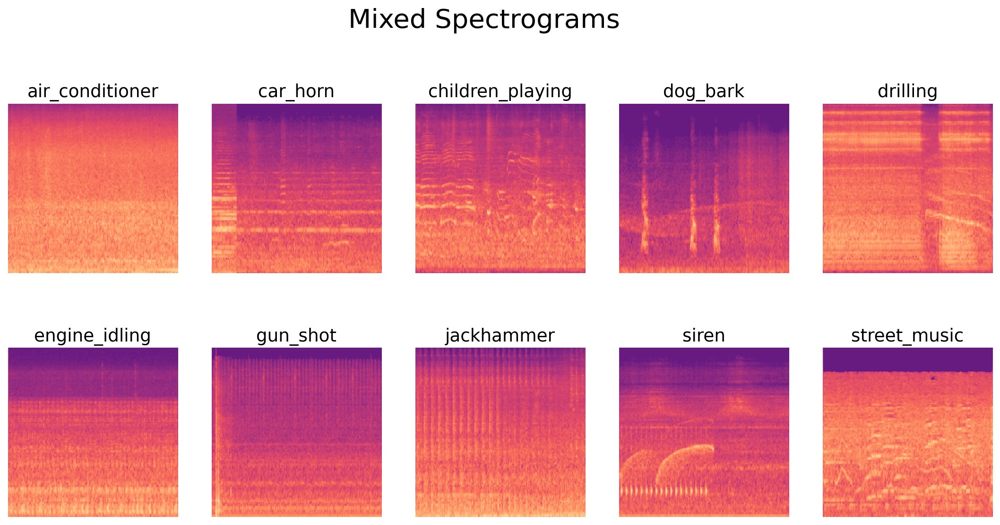

In [17]:
mix_df = pd.read_pickle(save_path + "mixup.pkl")
plot_specs(mix_df, label="Mixed Spectrograms", clss=random_samples)

## 3b. Image MixUp Augmentation

Just like 3a, except for operation order. Now we are reverting back to mixing images, as audio mixup did not show good results.


In [18]:
# alpha=0.6
imix_df = original_df.copy()

res = pcc_mixup(imix_df, batch_img_spec_mixup)
imix_df['r'] = imix_df.index.to_series().apply(lambda x: res[x])
imix_df['classID2'] = imix_df.r.apply(lambda x: x[1])
imix_df['r'] = imix_df.r.apply(lambda x: x[0])
imix_df[['slice_file_name', 'fold', 'class', 'classID',
         'r', 'classID2']].to_pickle(save_path + "imixup.pkl")

/Users/ivanstankov/Documents/Study/thesis_code/src/py/batchproc.py:104: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  split = np.array([df[df.fold == f].index.values for f in folds])


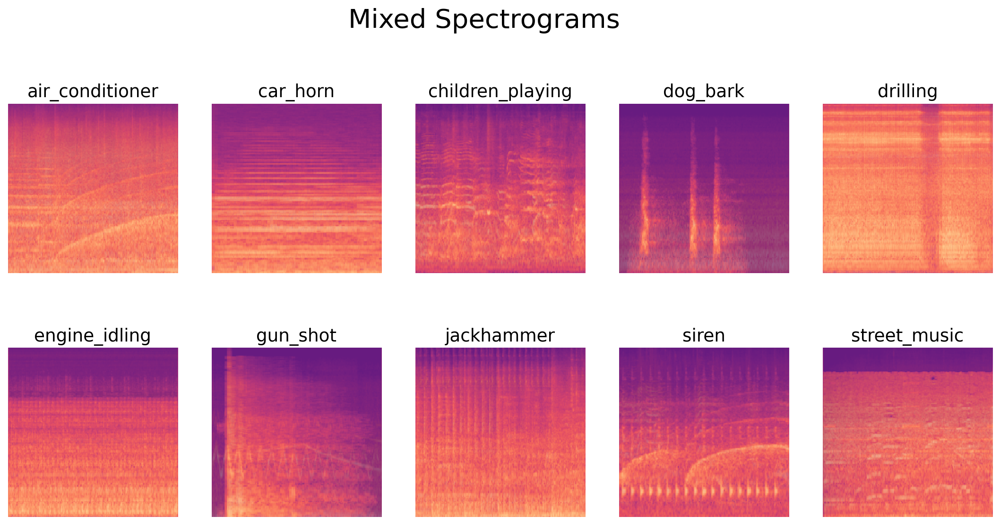

In [19]:
imix_df = pd.read_pickle(save_path + "imixup.pkl")
plot_specs(imix_df, label="Mixed Spectrograms", clss=random_samples)

## 4. Image Warping Augmentation

This is the only augmentation technique working with the spectrogram image and not signal directly. It is producing somewhat surreal results, but might be beneficial because of that.


In [20]:
warp_df = original_df.copy()

res = pcc(warp_df, batch_spec_warp, n_cores=16)
warp_df['r'] = warp_df.index.to_series().apply(lambda x: res[x])
warp_df[['slice_file_name', 'fold', 'class', 'classID', 'r']
        ].to_pickle(save_path + "warp.pkl")

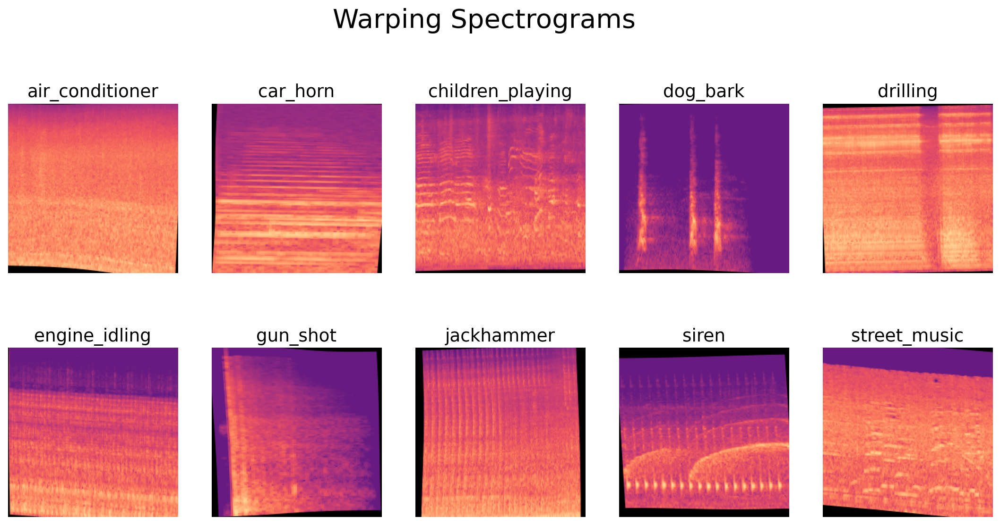

In [21]:
warp_df = pd.read_pickle(save_path + "warp.pkl")
plot_specs(warp_df, label="Warping Spectrograms", clss=random_samples)

## 5. Room Simulation Augmentation

The last effect considered. Although computationally heavy, it is relatively subtle. The main visual effect is blur alongside x-axis.


In [22]:
room_df = original_df.copy()

res = pcc(room_df, batch_spec_room, n_cores=16)
room_df['r'] = room_df.index.to_series().apply(lambda x: res[x])
room_df[['slice_file_name', 'fold', 'class', 'classID', 'r']
        ].to_pickle(save_path + "room.pkl")

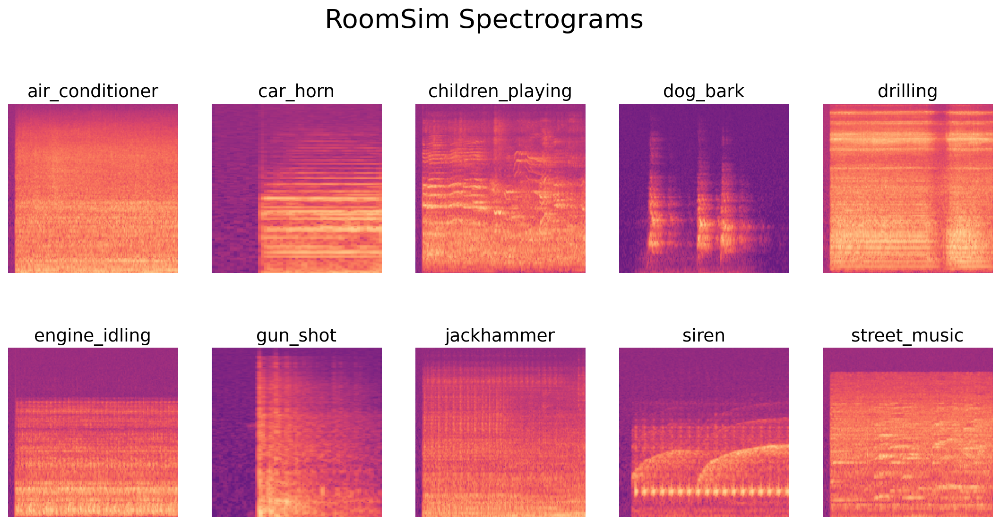

In [23]:
room_df = pd.read_pickle(save_path + "room.pkl")
plot_specs(room_df, label="RoomSim Spectrograms", clss=random_samples)